# Generating abstract art with GANs

## by Alexios Gkolovko (dit2102dsc)


In [1]:
#Import the needed libraries.
import os
import torch
import torchvision
import torch.nn as nn
from tqdm.notebook import tqdm
import torch.nn.functional as F
import matplotlib.pyplot as plt
from IPython.display import Image
import torchvision.transforms as T
from torch.utils.data import DataLoader
#from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image

In [2]:
#Check whether we have a CUDA or should run the experiments on the CPU.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [3]:
#Define the path to the dataset, and check if it exists. Change that in accordance to your filesystem.
path = '/home/dimitrig/Desktop/archive/Abstract_gallery/Abstract_gallery'
os.path.exists(path)

True

In [4]:
#The normalization parameters.
norm=((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

In [5]:
#Tranformations applied on the images, so as to exclude 'noise', normalize them etc. 
dtransform = T.Compose([
    T.Resize(128),
    T.CenterCrop(128),
    T.ToTensor(),
    T.Normalize(*norm,inplace=True),
])

In [6]:
ds = torchvision.datasets.ImageFolder(root=path, transform=dtransform)

In [7]:
#Denormalize the previously normalized data to increase performance.
def denorm(img_tensor):
    return img_tensor * norm[1][0] + norm[0][0]

In [8]:
#Import the data and apply the transformations. 128 refers to the size of the batch.
train_dataloader = DataLoader(ds, 128, shuffle=True, num_workers=3, pin_memory=True)

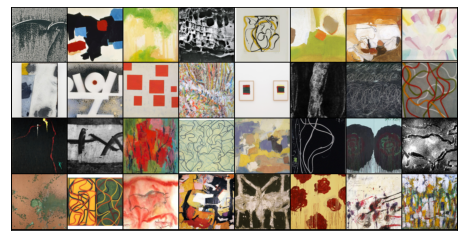

In [9]:
#Show part of the data 
def show_image(train_dataloader):
    for images,_ in train_dataloader:
        fig, ax = plt.subplots(figsize=(8,8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(images.detach()[:32]), nrow=8).permute(1,2,0))
        break
        
show_image(train_dataloader)

In [10]:
# Construct/Define the discriminator.
discriminator = nn.Sequential(
    #in: 128 x 3 x 128 x 128
    
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    #128 x 64 x 64 x 64
    
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    #128 x 128 x 32 x 32
    
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    #128 x 256 x 16 x 16
    
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    #128 x 512 x 8 x 8
    
    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    #128 x 1024 x 4 x 4
    
    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    #128 x 1 x 1 x 1
    
    nn.Flatten(),
    nn.Sigmoid()

)

In [11]:
#Construct/Define the generator.
generator = nn.Sequential(
    # Latent tensor here (128,1,1)
    
    nn.ConvTranspose2d(128, 1024, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(True),
    #128 x 1024 x 4 x 4
    
    nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    #128 x 512 x 8 x 8
    
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    #128 x 256 x 16 x 16
    
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    #128 x 128 x 32 x 32
    
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    #128 x 64 x 64 x 64
    
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    #128 x 3 x 128 x 128
    nn.Tanh()
)

In [12]:
# Methods to train the discriminator and the generator
def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    
    real_preds= discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(128, 128, 1, 1, device=device)
    fake_images = generator(latent)
    
    fake_preds= discriminator(fake_images)
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward(),
    opt_d.step()
    
    return loss.item(), real_score, fake_score

In [13]:
def train_generator(opt_g):
    opt_g.zero_grad()
    
    latent = torch.randn(128, 128, 1, 1, device=device)
    fake_images = generator(latent)
    
    preds = discriminator(fake_images)
    targets = torch.ones(fake_images.size(0), 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    loss.backward(),
    opt_g.step()
    
    return loss.item()

In [14]:
#Create a folder named 'generated'. The artificial images will be placed there.
sample_dir = "generated"
os.makedirs(sample_dir, exist_ok=True)

In [15]:
#The method to generate and store artificial .png images.
def save_sample(index, fixed_latent, show=True):
    fake_images = generator(fixed_latent)
    fake_fname = "generated-images-{0:0=4d}.png".format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    if show:
        fig, ax = plt.subplots(figsize=(8,8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach()[:32], nrow=8).permute(1,2,0))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


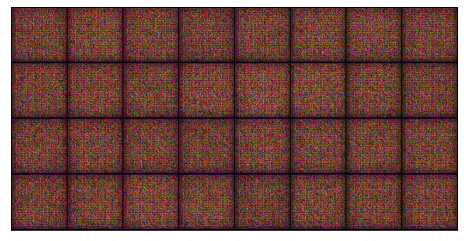

In [16]:
fixed_latent = torch.randn(128, 128, 1, 1, device=device)
save_sample(0, fixed_latent, show=True)

In [17]:
#The method that trains the model.
def fit(epochs, lr_d, lr_g, start_idx=1):
    #torch.cuda.empty_cache()
    
    losses_d = []
    losses_g = []
    real_scores = []
    fake_scores = []
    
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images,_ in tqdm(train_dataloader):
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)
            
        losses_d.append(loss_d)
        losses_g.append(loss_g)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print("Epoch: [{}/{}], loss_d: {:.4f}, loss_g: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
        epoch+1, epochs, loss_d, loss_g, real_score, fake_score))
        
        save_sample(epoch+start_idx, fixed_latent, show=False)
        
    return losses_d, losses_g, real_scores, fake_scores

In [18]:
epochs = 10
lr_d = 10e-5
lr_g = 10e-4

# Run for 10 epochs (in my desktop computer, approximately 1 hour)
history = [fit(epochs, lr_d, lr_g, start_idx=1)]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [1/10], loss_d: 0.9821, loss_g: 10.2532, real_score: 0.5485, fake_score: 0.2943


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [2/10], loss_d: 0.3440, loss_g: 9.0133, real_score: 0.7221, fake_score: 0.0062


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [3/10], loss_d: 2.6632, loss_g: 7.1725, real_score: 0.6124, fake_score: 0.7939


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [4/10], loss_d: 1.2785, loss_g: 4.3123, real_score: 0.5227, fake_score: 0.4245


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [5/10], loss_d: 1.5187, loss_g: 4.2113, real_score: 0.5511, fake_score: 0.5722


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [6/10], loss_d: 1.3515, loss_g: 3.9182, real_score: 0.6031, fake_score: 0.5310


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [7/10], loss_d: 1.2867, loss_g: 3.5554, real_score: 0.5986, fake_score: 0.5067


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [8/10], loss_d: 1.2153, loss_g: 2.8473, real_score: 0.5411, fake_score: 0.4210


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [9/10], loss_d: 1.5153, loss_g: 2.2732, real_score: 0.4491, fake_score: 0.4740


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: [10/10], loss_d: 1.5108, loss_g: 1.8364, real_score: 0.4321, fake_score: 0.4529


In [19]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

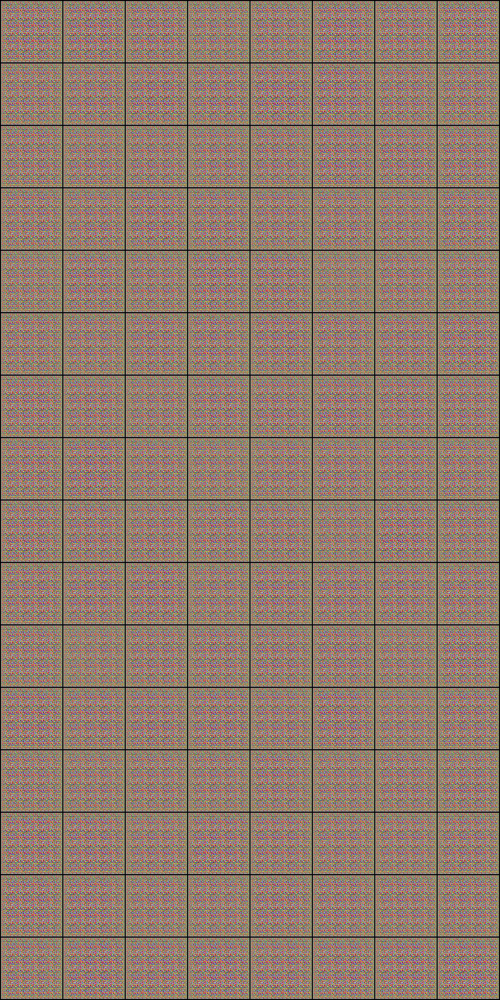

In [20]:
# The first and last generated pictures produced by the generator.
Image("./generated/generated-images-0001.png")

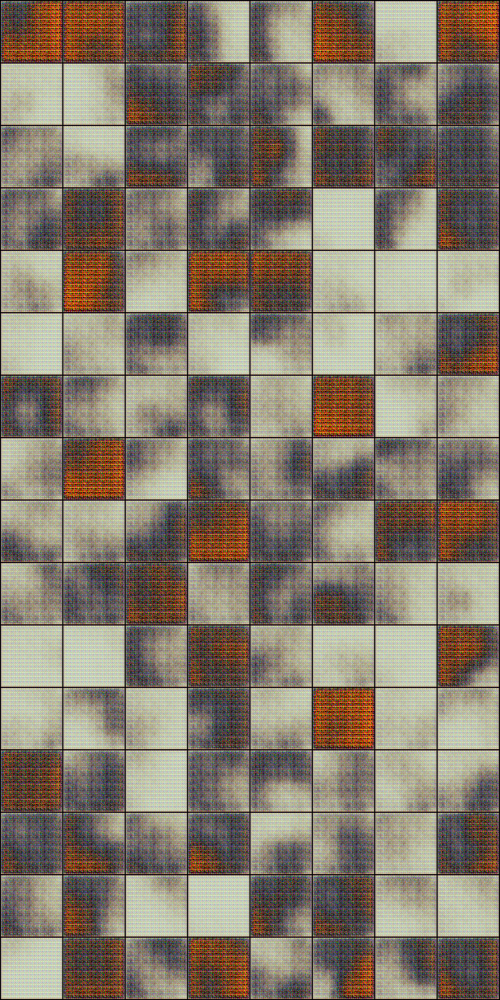

In [21]:


Image("./generated/generated-images-0010.png")

In [23]:
print(history)

[([0.9821212291717529, 0.34398016333580017, 2.6631650924682617, 1.278470516204834, 1.5187488794326782, 1.3514604568481445, 1.2867023944854736, 1.2152947187423706, 1.5152868032455444, 1.5107977390289307], [10.253166198730469, 9.013253211975098, 7.172544956207275, 4.312325477600098, 4.211333751678467, 3.9182019233703613, 3.555393695831299, 2.8472633361816406, 2.2731945514678955, 1.836423397064209], [0.5484946370124817, 0.7220617532730103, 0.6124340891838074, 0.522695779800415, 0.5510554313659668, 0.6031467914581299, 0.598560631275177, 0.5410507917404175, 0.44909653067588806, 0.4321041405200958], [0.2943485975265503, 0.006207373924553394, 0.7939351797103882, 0.42452263832092285, 0.5721517205238342, 0.5310229063034058, 0.506687343120575, 0.4209554195404053, 0.4740072786808014, 0.45289379358291626])]


In [35]:
# Partition of the 'history' table into its components, in order to visualize them.
generator_losses= history[0][0]
discriminator_losses = history[0][1]
real_scores = history[0][2]
fake_scores = history[0][3]

In [36]:
print(generator_losses)

[0.9821212291717529, 0.34398016333580017, 2.6631650924682617, 1.278470516204834, 1.5187488794326782, 1.3514604568481445, 1.2867023944854736, 1.2152947187423706, 1.5152868032455444, 1.5107977390289307]


In [37]:
print(discriminator_losses)

[10.253166198730469, 9.013253211975098, 7.172544956207275, 4.312325477600098, 4.211333751678467, 3.9182019233703613, 3.555393695831299, 2.8472633361816406, 2.2731945514678955, 1.836423397064209]


In [38]:
print(real_scores)

[0.5484946370124817, 0.7220617532730103, 0.6124340891838074, 0.522695779800415, 0.5510554313659668, 0.6031467914581299, 0.598560631275177, 0.5410507917404175, 0.44909653067588806, 0.4321041405200958]


In [39]:
print(fake_scores)

[0.2943485975265503, 0.006207373924553394, 0.7939351797103882, 0.42452263832092285, 0.5721517205238342, 0.5310229063034058, 0.506687343120575, 0.4209554195404053, 0.4740072786808014, 0.45289379358291626]


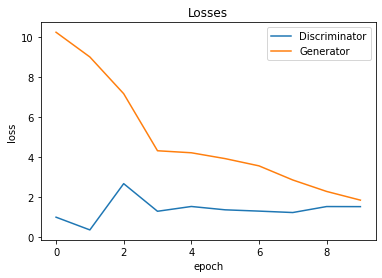

In [40]:
# Visualizations of the losses and the scores achieved.
plt.plot(generator_losses, '-')
plt.plot(discriminator_losses, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

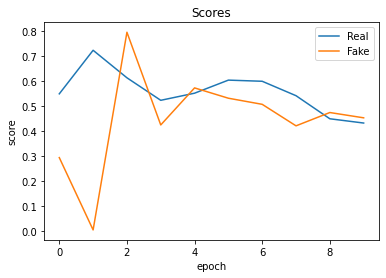

In [41]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');